In [1]:
import pandas as pd

data = pd.read_csv('data_sample_three_years.csv')

data = data.iloc[:, [0,1,2,3,4]]
data.rename(columns={'date': 'open', 'low':'close', 'open':'high', 'high':'low'}, inplace=True)

data['date'] = pd.to_datetime(data['timestamp'], unit='s')
data = data.iloc[:, [0,5,1,2,3,4]]

data_backup = data.loc[ data.timestamp >= 1675814400 ]
data = data.loc[ data.timestamp < 1675814400 ]

from talib import RSI
data['rsi'] = RSI(data['close'])

from talib import MA, SMA, EMA
data['ma'] = MA(data['close'])

In [2]:
data['close+'] = data['close'].shift(1)
data.dropna(axis=0, inplace=True)

In [3]:
data

,timestamp,date,open,high,low,close,rsi,ma,close+
29,1612879200,2021-02-09 14:00:00,1743.07,1760.89,1735.27,1760.23,60.726497,1710.117667,1743.08
30,1612882800,2021-02-09 15:00:00,1760.23,1761.00,1743.88,1751.09,58.774198,1715.234333,1760.23
31,1612886400,2021-02-09 16:00:00,1751.10,1765.00,1721.93,1736.78,55.752107,1720.006667,1751.09
32,1612890000,2021-02-09 17:00:00,1736.66,1751.13,1734.10,1744.33,57.008134,1725.372667,1736.78
33,1612893600,2021-02-09 18:00:00,1744.34,1761.43,1739.39,1754.75,58.748543,1729.864333,1744.33
...,...,...,...,...,...,...,...,...,...
16257,1675792800,2023-02-07 18:00:00,1672.03,1679.03,1625.48,1638.52,51.870094,1633.974000,1637.98
16258,1675796400,2023-02-07 19:00:00,1638.52,1658.48,1637.64,1656.42,63.059562,1634.561333,1638.52
16259,1675800000,2023-02-07 20:00:00,1656.43,1668.77,1650.16,1664.93,66.988870,1635.701000,1656.42
16260,1675803600,2023-02-07 21:00:00,1664.86,1674.72,1663.76,1667.43,68.063590,1637.200000,1664.93


In [4]:
inputs = data.iloc[:, [7,8]]
target = data.iloc[:, [5]]

In [5]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, accuracy_score

X_train, X_test, y_train, y_test = train_test_split(inputs, target, test_size=0.2, random_state=1, shuffle=False)

In [6]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
import xgboost

2024-02-28 05:58:36.430966: I external/local_tsl/tsl/cuda/cudart_stub.cc:31] Could not find cuda drivers on your machine, GPU will not be used.
2024-02-28 05:58:36.575367: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-02-28 05:58:36.575472: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-02-28 05:58:36.584192: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-02-28 05:58:36.608743: I external/local_tsl/tsl/cuda/cudart_stub.cc:31] Could not find cuda drivers on your machine, GPU will not be used.
2024-02-28 05:58:39.886874: W tensorflow/compiler/tf2tensorrt/utils/py_utils.

In [7]:
# Define and train the LSTM model
model = Sequential([
    Dense(64, activation='relu', input_shape=(2,)),  # Input layer with 10 features
    Dense(64, activation='relu'),                     # Hidden layer with 64 units
    Dense(1)                                          # Output layer with 1 unit for regression
])

# Compile the model
model.compile(optimizer='adam', loss='mse')  # Using Mean Squared Error loss for regression

# Train the model
model.fit(X_train, y_train, epochs=100, batch_size=32)

Epoch 1/100
406/406 [==============================] - 2s 2ms/step - loss: 174862.0000
Epoch 2/100
406/406 [==============================] - 1s 2ms/step - loss: 1250.4054
Epoch 3/100
406/406 [==============================] - 1s 2ms/step - loss: 883.2719
Epoch 4/100
406/406 [==============================] - 1s 2ms/step - loss: 864.9980
Epoch 5/100
406/406 [==============================] - 1s 2ms/step - loss: 850.6674
Epoch 6/100
406/406 [==============================] - 1s 2ms/step - loss: 853.2960
Epoch 7/100
406/406 [==============================] - 1s 2ms/step - loss: 900.2004
Epoch 8/100
406/406 [==============================] - 1s 3ms/step - loss: 864.6398
Epoch 9/100
406/406 [==============================] - 1s 2ms/step - loss: 873.7917
Epoch 10/100
406/406 [==============================] - 1s 2ms/step - loss: 933.8602
Epoch 11/100
406/406 [==============================] - 1s 2ms/step - loss: 1002.3033
Epoch 12/100
406/406 [==============================] - 1s 2ms/step -

In [8]:
pred = model.predict(X_test)
y_test['pred'] = pred.reshape(1,-1)[0]

102/102 [==============================] - 0s 1ms/step


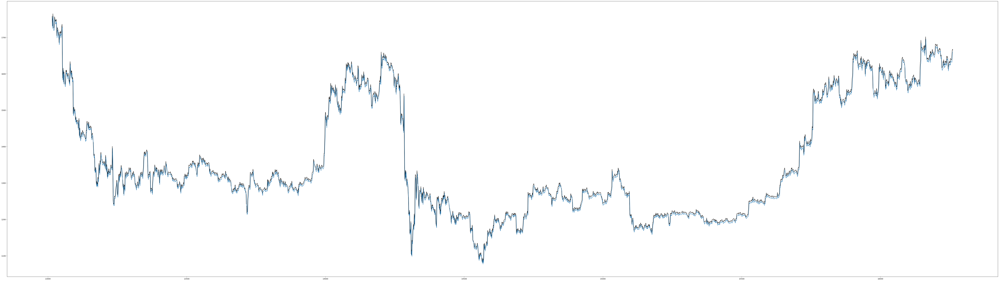

In [9]:
import matplotlib.pyplot as plt

plt.figure(figsize=(100, 28))

plt.plot(y_test['close'], color='black')
plt.plot(y_test['pred'])

## adding extra factors

In [10]:
data

,timestamp,date,open,high,low,close,rsi,ma,close+
29,1612879200,2021-02-09 14:00:00,1743.07,1760.89,1735.27,1760.23,60.726497,1710.117667,1743.08
30,1612882800,2021-02-09 15:00:00,1760.23,1761.00,1743.88,1751.09,58.774198,1715.234333,1760.23
31,1612886400,2021-02-09 16:00:00,1751.10,1765.00,1721.93,1736.78,55.752107,1720.006667,1751.09
32,1612890000,2021-02-09 17:00:00,1736.66,1751.13,1734.10,1744.33,57.008134,1725.372667,1736.78
33,1612893600,2021-02-09 18:00:00,1744.34,1761.43,1739.39,1754.75,58.748543,1729.864333,1744.33
...,...,...,...,...,...,...,...,...,...
16257,1675792800,2023-02-07 18:00:00,1672.03,1679.03,1625.48,1638.52,51.870094,1633.974000,1637.98
16258,1675796400,2023-02-07 19:00:00,1638.52,1658.48,1637.64,1656.42,63.059562,1634.561333,1638.52
16259,1675800000,2023-02-07 20:00:00,1656.43,1668.77,1650.16,1664.93,66.988870,1635.701000,1656.42
16260,1675803600,2023-02-07 21:00:00,1664.86,1674.72,1663.76,1667.43,68.063590,1637.200000,1664.93


In [11]:
correlation_matrix = data.corr()

In [12]:
correlation_matrix

,timestamp,date,open,high,low,close,rsi,ma,close+
timestamp,1.000000,1.000000,-0.483480,-0.486182,-0.480224,-0.483663,-0.045790,-0.482232,-0.483513
date,1.000000,1.000000,-0.483480,-0.486182,-0.480224,-0.483663,-0.045790,-0.482232,-0.483513
open,-0.483480,-0.483480,1.000000,0.999833,0.999693,0.999675,0.054461,0.997186,0.999986
high,-0.486182,-0.486182,0.999833,1.000000,0.999560,0.999819,0.057192,0.997226,0.999818
low,-0.480224,-0.480224,0.999693,0.999560,1.000000,0.999755,0.062031,0.996469,0.999677
close,-0.483663,-0.483663,0.999675,0.999819,0.999755,1.000000,0.062095,0.996888,0.999660
rsi,-0.045790,-0.045790,0.054461,0.057192,0.062031,0.062095,1.000000,-0.004063,0.054092
ma,-0.482232,-0.482232,0.997186,0.997226,0.996469,0.996888,-0.004063,1.000000,0.997190
close+,-0.483513,-0.483513,0.999986,0.999818,0.999677,0.999660,0.054092,0.997190,1.000000


## data scaled:

In [13]:
import pandas as pd

data2 = pd.read_csv('data_sample_three_years.csv')

data2 = data2.iloc[:, [0,1,2,3,4]]
data2.rename(columns={'date': 'open', 'low':'close', 'open':'high', 'high':'low'}, inplace=True)

data2['date'] = pd.to_datetime(data2['timestamp'], unit='s')
data2 = data2.iloc[:, [0,5,1,2,3,4]]

data_backup2 = data2.loc[ data2.timestamp >= 1675814400 ]
data2 = data2.loc[ data2.timestamp < 1675814400 ]

from talib import RSI
data2['rsi'] = RSI(data2['close'])

from talib import MA, SMA, EMA
data2['ma'] = MA(data2['close'])

In [14]:
data2['close+'] = data2['close'].shift(1)
data2.dropna(axis=0, inplace=True)

In [15]:
data2

,timestamp,date,open,high,low,close,rsi,ma,close+
29,1612879200,2021-02-09 14:00:00,1743.07,1760.89,1735.27,1760.23,60.726497,1710.117667,1743.08
30,1612882800,2021-02-09 15:00:00,1760.23,1761.00,1743.88,1751.09,58.774198,1715.234333,1760.23
31,1612886400,2021-02-09 16:00:00,1751.10,1765.00,1721.93,1736.78,55.752107,1720.006667,1751.09
32,1612890000,2021-02-09 17:00:00,1736.66,1751.13,1734.10,1744.33,57.008134,1725.372667,1736.78
33,1612893600,2021-02-09 18:00:00,1744.34,1761.43,1739.39,1754.75,58.748543,1729.864333,1744.33
...,...,...,...,...,...,...,...,...,...
16257,1675792800,2023-02-07 18:00:00,1672.03,1679.03,1625.48,1638.52,51.870094,1633.974000,1637.98
16258,1675796400,2023-02-07 19:00:00,1638.52,1658.48,1637.64,1656.42,63.059562,1634.561333,1638.52
16259,1675800000,2023-02-07 20:00:00,1656.43,1668.77,1650.16,1664.93,66.988870,1635.701000,1656.42
16260,1675803600,2023-02-07 21:00:00,1664.86,1674.72,1663.76,1667.43,68.063590,1637.200000,1664.93


In [16]:
inputs2 = data2.iloc[:, [6,7,8]]
target2 = data2.iloc[:, [5]]

In [17]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, accuracy_score

X_train2, X_test2, y_train2, y_test2 = train_test_split(inputs2, target2, test_size=0.2, random_state=1, shuffle=False)

In [18]:
X_train2

,rsi,ma,close+
29,60.726497,1710.117667,1743.08
30,58.774198,1715.234333,1760.23
31,55.752107,1720.006667,1751.09
32,57.008134,1725.372667,1736.78
33,58.748543,1729.864333,1744.33
...,...,...,...
13010,58.896351,1748.917333,1760.36
13011,60.029914,1750.529333,1767.36
13012,60.210983,1752.046000,1769.84
13013,52.541380,1753.259667,1770.22


In [65]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler

scaler2 = MinMaxScaler()
scaler2.fit(X_train2)

X_train2_scaled = scaler2.transform(X_train2)
X_test2_scaled = scaler2.transform(X_test2)

In [20]:
X_train2_scaled.reshape(3,-1)

array([[0.66196196, 0.19183374, 0.21267619, ..., 0.55977735, 0.51304861,
        0.56004543],
       [0.55960768, 0.62871668, 0.56001954, ..., 0.47059997, 0.45625275,
        0.47872722],
       [0.46972476, 0.45697449, 0.48860181, ..., 0.57599996, 0.20347578,
        0.21666979]])

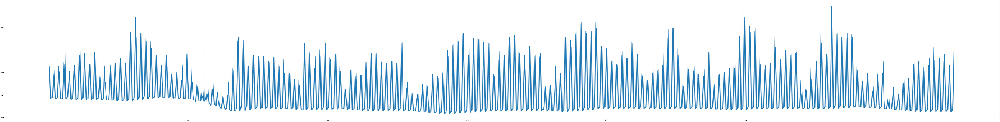

In [21]:
import matplotlib.pyplot as plt

plt.figure(figsize=(150,18))

plt.plot(X_test2_scaled.reshape(3,-1)[1])

In [22]:
correlation_matrix2 = np.corrcoef(X_train2_scaled, rowvar=False)

In [23]:
correlation_matrix2

array([[ 1.        , -0.0043668 ,  0.06678047],
       [-0.0043668 ,  1.        ,  0.99612056],
       [ 0.06678047,  0.99612056,  1.        ]])

In [24]:
X_train2

,rsi,ma,close+
29,60.726497,1710.117667,1743.08
30,58.774198,1715.234333,1760.23
31,55.752107,1720.006667,1751.09
32,57.008134,1725.372667,1736.78
33,58.748543,1729.864333,1744.33
...,...,...,...
13010,58.896351,1748.917333,1760.36
13011,60.029914,1750.529333,1767.36
13012,60.210983,1752.046000,1769.84
13013,52.541380,1753.259667,1770.22


In [25]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
import xgboost

In [26]:
# Define and train the LSTM model
model2 = Sequential([
    Dense(64, activation='relu', input_shape=(3,)),  # Input layer with 10 features
    Dense(64, activation='relu'),                     # Hidden layer with 64 units
    Dense(1)                                          # Output layer with 1 unit for regression
])

# Compile the model
model2.compile(optimizer='adam', loss='mse')  # Using Mean Squared Error loss for regression

# Train the model
model2.fit(X_train2_scaled, y_train2, epochs=100, batch_size=32)

Epoch 1/100
406/406 [==============================] - 2s 2ms/step - loss: 6911987.5000
Epoch 2/100
406/406 [==============================] - 1s 2ms/step - loss: 945043.5625
Epoch 3/100
406/406 [==============================] - 1s 2ms/step - loss: 140216.1094
Epoch 4/100
406/406 [==============================] - 1s 2ms/step - loss: 100482.9531
Epoch 5/100
406/406 [==============================] - 1s 2ms/step - loss: 64161.6641
Epoch 6/100
406/406 [==============================] - 1s 2ms/step - loss: 35381.6836
Epoch 7/100
406/406 [==============================] - 1s 2ms/step - loss: 16314.0566
Epoch 8/100
406/406 [==============================] - 1s 3ms/step - loss: 6357.1938
Epoch 9/100
406/406 [==============================] - 1s 2ms/step - loss: 2492.3994
Epoch 10/100
406/406 [==============================] - 1s 3ms/step - loss: 1346.9841
Epoch 11/100
406/406 [==============================] - 1s 2ms/step - loss: 1010.0016
Epoch 12/100
406/406 [=============================

In [27]:
pred2 = model2.predict(X_test2_scaled)
y_test2['pred'] = pred2.reshape(1,-1)[0]

102/102 [==============================] - 0s 1ms/step


In [28]:
pred2

array([[1767.7605],
       [1731.6251],
       [1735.0023],
       ...,
       [1678.1184],
       [1685.6245],
       [1683.7122]], dtype=float32)

In [29]:
y_test2

,close,pred
13015,1757.69,1767.760498
13016,1731.25,1731.625122
13017,1744.47,1735.002319
13018,1765.01,1763.544922
13019,1735.29,1750.591797
...,...,...
16257,1638.52,1642.553589
16258,1656.42,1660.552734
16259,1664.93,1678.118408
16260,1667.43,1685.624512


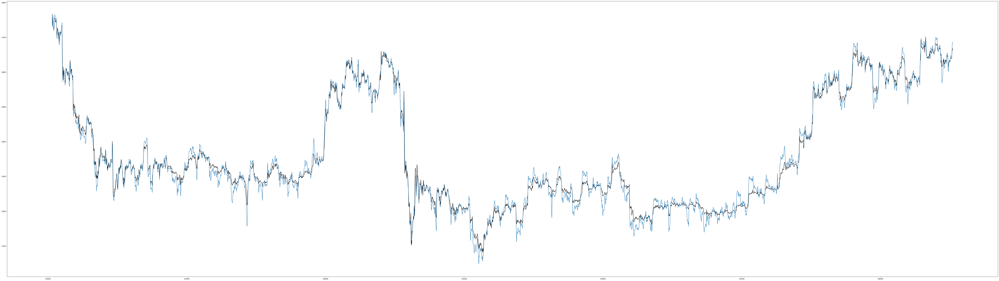

In [30]:
import matplotlib.pyplot as plt

plt.figure(figsize=(100, 28))

plt.plot(y_test2['close'], color='black')
plt.plot(y_test2['pred'])

## pred2 with backup data

In [63]:
from talib import RSI
data_backup2['rsi'] = RSI(data_backup2['close'])

from talib import MA, SMA, EMA
data_backup2['ma'] = MA(data_backup2['close'])

data_backup2['close+'] = data_backup2['close'].shift(1)
data_backup2.dropna(axis=0, inplace=True)

In [64]:
inputs_backup2 = data_backup2.iloc[:, [6,7,8]]
target_backup2 = data_backup2.iloc[:, [5]]

In [66]:
inputs_backup2_scaled = scaler2.transform(inputs_backup2)

In [67]:
pred_backup2 = model2.predict(inputs_backup2_scaled)

253/253 [==============================] - 0s 2ms/step


In [72]:
raw_data2 = data_backup2.iloc[:, [0,1,2,3,4,5,6,7]]
raw_data2['pred_backup'] = pred_backup2
raw_data2['pred_backup'] = raw_data2['pred_backup'].shift(1)

In [74]:
raw_data2.to_excel('raw_data_2.xlsx')

## adding more factors

In [1]:
import pandas as pd

data3 = pd.read_csv('data_sample_three_years.csv')

data3 = data3.iloc[:, [0,1,2,3,4]]
data3.rename(columns={'date': 'open', 'low':'close', 'open':'high', 'high':'low'}, inplace=True)

data3['date'] = pd.to_datetime(data3['timestamp'], unit='s')
data3 = data3.iloc[:, [0,5,1,2,3,4]]

data_backup3 = data3.loc[ data3.timestamp >= 1675814400 ]
data3 = data3.loc[ data3.timestamp < 1675814400 ]

from talib import RSI
data3['rsi_14'] = RSI(data3['close'], timeperiod=14)
data3['rsi_30'] = RSI(data3['close'], timeperiod=30)

from talib import MA, SMA, EMA
data3['ma_9'] = MA(data3['close'], timeperiod=9)
data3['ma_52'] = MA(data3['close'], timeperiod=52)

In [2]:
data3['close+'] = data3['close'].shift(1)
data3.dropna(axis=0, inplace=True)

In [3]:
data3

,timestamp,date,open,high,low,close,rsi_14,rsi_30,ma_9,ma_52,close+
51,1612987200,2021-02-10 20:00:00,1744.45,1746.94,1707.56,1713.47,41.396850,52.721834,1747.441111,1734.433462,1744.46
52,1612990800,2021-02-10 21:00:00,1713.46,1730.29,1706.51,1729.62,45.605115,54.170615,1738.484444,1736.972500,1713.47
53,1612998000,2021-02-10 23:00:00,1751.71,1762.46,1737.55,1743.31,48.951535,55.369904,1732.302222,1739.851346,1729.62
54,1613001600,2021-02-11 00:00:00,1743.30,1752.58,1710.00,1720.29,44.044688,52.959186,1729.332222,1742.484808,1743.31
55,1613005200,2021-02-11 01:00:00,1720.29,1727.52,1704.21,1710.15,42.045415,51.928947,1727.735556,1744.218462,1720.29
...,...,...,...,...,...,...,...,...,...,...,...
16257,1675792800,2023-02-07 18:00:00,1672.03,1679.03,1625.48,1638.52,51.870094,49.589954,1637.107778,1640.040385,1637.98
16258,1675796400,2023-02-07 19:00:00,1638.52,1658.48,1637.64,1656.42,63.059562,54.961922,1639.923333,1639.898846,1638.52
16259,1675800000,2023-02-07 20:00:00,1656.43,1668.77,1650.16,1664.93,66.988870,57.204827,1643.332222,1639.884231,1656.42
16260,1675803600,2023-02-07 21:00:00,1664.86,1674.72,1663.76,1667.43,68.063590,57.842849,1647.513333,1640.009615,1664.93


In [4]:
inputs3 = data3.iloc[:, [6,7,8,9,10]]
target3 = data3.iloc[:, [5]]

In [5]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, accuracy_score

X_train3, X_test3, y_train3, y_test3 = train_test_split(inputs3, target3, test_size=0.2, random_state=1, shuffle=False)

In [6]:
X_train3

,rsi_14,rsi_30,ma_9,ma_52,close+
51,41.396850,52.721834,1747.441111,1734.433462,1744.46
52,45.605115,54.170615,1738.484444,1736.972500,1713.47
53,48.951535,55.369904,1732.302222,1739.851346,1729.62
54,44.044688,52.959186,1729.332222,1742.484808,1743.31
55,42.045415,51.928947,1727.735556,1744.218462,1720.29
...,...,...,...,...,...
13014,54.225769,57.805301,1766.081111,1740.373462,1758.85
13015,51.508260,56.713746,1764.858889,1741.089615,1761.90
13016,38.469285,50.516308,1760.370000,1741.211538,1757.69
13017,45.850318,53.163593,1757.993333,1741.787885,1731.25


In [7]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler

scaler3 = MinMaxScaler()
scaler3.fit(X_train3)

X_train3_scaled = scaler3.transform(X_train3)
X_test3_scaled = scaler3.transform(X_test3)

In [8]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
import xgboost

2024-03-28 06:48:11.034078: I external/local_tsl/tsl/cuda/cudart_stub.cc:31] Could not find cuda drivers on your machine, GPU will not be used.
2024-03-28 06:48:12.197044: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-03-28 06:48:12.197336: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-03-28 06:48:12.396248: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-03-28 06:48:12.774400: I external/local_tsl/tsl/cuda/cudart_stub.cc:31] Could not find cuda drivers on your machine, GPU will not be used.
2024-03-28 06:48:17.571839: W tensorflow/compiler/tf2tensorrt/utils/py_utils.

In [9]:
X_train3

,rsi_14,rsi_30,ma_9,ma_52,close+
51,41.396850,52.721834,1747.441111,1734.433462,1744.46
52,45.605115,54.170615,1738.484444,1736.972500,1713.47
53,48.951535,55.369904,1732.302222,1739.851346,1729.62
54,44.044688,52.959186,1729.332222,1742.484808,1743.31
55,42.045415,51.928947,1727.735556,1744.218462,1720.29
...,...,...,...,...,...
13014,54.225769,57.805301,1766.081111,1740.373462,1758.85
13015,51.508260,56.713746,1764.858889,1741.089615,1761.90
13016,38.469285,50.516308,1760.370000,1741.211538,1757.69
13017,45.850318,53.163593,1757.993333,1741.787885,1731.25


In [10]:
# Define and train the LSTM model
model3 = Sequential([
    Dense(64, activation='relu', input_shape=(5,)),  # Input layer with 10 features
    Dense(64, activation='relu'),                     # Hidden layer with 64 units
    Dense(1)                                          # Output layer with 1 unit for regression
])

# Compile the model
model3.compile(optimizer='adam', loss='mse')  # Using Mean Squared Error loss for regression

# Train the model
model3.fit(X_train3_scaled, y_train3, epochs=100, batch_size=32)

Epoch 1/100
406/406 [==============================] - 2s 2ms/step - loss: 6033897.0000
Epoch 2/100
406/406 [==============================] - 1s 2ms/step - loss: 283666.2500
Epoch 3/100
406/406 [==============================] - 1s 2ms/step - loss: 105309.8984
Epoch 4/100
406/406 [==============================] - 1s 2ms/step - loss: 60440.3789
Epoch 5/100
406/406 [==============================] - 1s 2ms/step - loss: 28940.9727
Epoch 6/100
406/406 [==============================] - 1s 2ms/step - loss: 11758.7061
Epoch 7/100
406/406 [==============================] - 1s 3ms/step - loss: 4808.0103
Epoch 8/100
406/406 [==============================] - 1s 2ms/step - loss: 2580.8525
Epoch 9/100
406/406 [==============================] - 1s 2ms/step - loss: 1763.0326
Epoch 10/100
406/406 [==============================] - 1s 2ms/step - loss: 1298.8956
Epoch 11/100
406/406 [==============================] - 1s 2ms/step - loss: 1000.2179
Epoch 12/100
406/406 [==============================]

In [11]:
pred3 = model3.predict(X_test3_scaled)
y_test3['pred'] = pred3.reshape(1,-1)[0]

102/102 [==============================] - 0s 1ms/step


In [13]:
mean_squared_error(pred3, y_test3['close'])

459.4844272324284

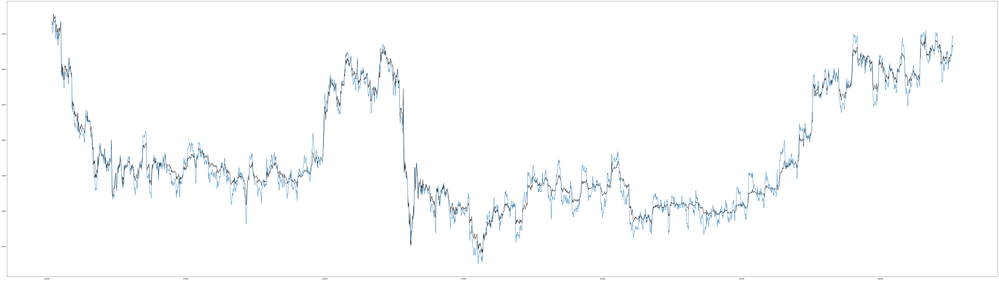

In [12]:
import matplotlib.pyplot as plt

plt.figure(figsize=(100, 28))

plt.plot(y_test3['close'], color='black')
plt.plot(y_test3['pred'])

- standart sapmayı ekle
- son 10 bardan veri al

## pred3 with backup data:

In [78]:
from talib import RSI
data_backup3['rsi_14'] = RSI(data_backup3['close'], timeperiod=14)
data_backup3['rsi_30'] = RSI(data_backup3['close'], timeperiod=30)

from talib import MA, SMA, EMA
data_backup3['ma_9'] = MA(data_backup3['close'], timeperiod=9)
data_backup3['ma_52'] = MA(data_backup3['close'], timeperiod=52)

data_backup3['close+'] = data_backup3['close'].shift(1)
data_backup3.dropna(axis=0, inplace=True)

inputs_backup3 = data_backup3.iloc[:, [6,7,8,9,10]]
target_backup3 = data_backup3.iloc[:, [5]]

inputs_backup3_scaled = scaler3.transform(inputs_backup3)

pred_backup3 = model3.predict(inputs_backup3_scaled)

247/247 [==============================] - 0s 1ms/step


In [80]:
raw_data3 = data_backup3.iloc[:, [0,1,2,3,4,5,6,7,8,9]]
raw_data3['pred_backup'] = pred_backup3
raw_data3['pred_backup'] = raw_data3['pred_backup'].shift(1)

In [81]:
raw_data3.to_excel('raw_data_3.xlsx')

## son 10 barlık veri ile multi factor:

In [14]:
import pandas as pd

data4 = pd.read_csv('data_sample_three_years.csv')

data4 = data4.iloc[:, [0,1,2,3,4]]
data4.rename(columns={'date': 'open', 'low':'close', 'open':'high', 'high':'low'}, inplace=True)

data4['date'] = pd.to_datetime(data4['timestamp'], unit='s')
data4 = data4.iloc[:, [0,5,1,2,3,4]]

data_backup4 = data4.loc[ data4.timestamp >= 1675814400 ]
data4 = data4.loc[ data4.timestamp < 1675814400 ]

from talib import RSI
data4['rsi_14'] = RSI(data4['close'], timeperiod=14)
data4['rsi_30'] = RSI(data4['close'], timeperiod=30)

from talib import MA, SMA, EMA
data4['ma_9'] = MA(data4['close'], timeperiod=9)
data4['ma_52'] = MA(data4['close'], timeperiod=52)

In [15]:
for i in range(1,11):
    data4[f'close+{i}'] = data4['close'].shift(i)
data4.dropna(axis=0, inplace=True)

In [16]:
data4

,timestamp,date,open,high,low,close,rsi_14,rsi_30,ma_9,ma_52,close+1,close+2,close+3,close+4,close+5,close+6,close+7,close+8,close+9,close+10
51,1612987200,2021-02-10 20:00:00,1744.45,1746.94,1707.56,1713.47,41.396850,52.721834,1747.441111,1734.433462,1744.46,1743.74,1729.11,1715.47,1724.52,1747.02,1798.95,1810.23,1816.73,1806.96
52,1612990800,2021-02-10 21:00:00,1713.46,1730.29,1706.51,1729.62,45.605115,54.170615,1738.484444,1736.972500,1713.47,1744.46,1743.74,1729.11,1715.47,1724.52,1747.02,1798.95,1810.23,1816.73
53,1612998000,2021-02-10 23:00:00,1751.71,1762.46,1737.55,1743.31,48.951535,55.369904,1732.302222,1739.851346,1729.62,1713.47,1744.46,1743.74,1729.11,1715.47,1724.52,1747.02,1798.95,1810.23
54,1613001600,2021-02-11 00:00:00,1743.30,1752.58,1710.00,1720.29,44.044688,52.959186,1729.332222,1742.484808,1743.31,1729.62,1713.47,1744.46,1743.74,1729.11,1715.47,1724.52,1747.02,1798.95
55,1613005200,2021-02-11 01:00:00,1720.29,1727.52,1704.21,1710.15,42.045415,51.928947,1727.735556,1744.218462,1720.29,1743.31,1729.62,1713.47,1744.46,1743.74,1729.11,1715.47,1724.52,1747.02
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16257,1675792800,2023-02-07 18:00:00,1672.03,1679.03,1625.48,1638.52,51.870094,49.589954,1637.107778,1640.040385,1637.98,1638.67,1640.39,1642.03,1641.25,1629.80,1634.25,1631.08,1632.86,1629.10
16258,1675796400,2023-02-07 19:00:00,1638.52,1658.48,1637.64,1656.42,63.059562,54.961922,1639.923333,1639.898846,1638.52,1637.98,1638.67,1640.39,1642.03,1641.25,1629.80,1634.25,1631.08,1632.86
16259,1675800000,2023-02-07 20:00:00,1656.43,1668.77,1650.16,1664.93,66.988870,57.204827,1643.332222,1639.884231,1656.42,1638.52,1637.98,1638.67,1640.39,1642.03,1641.25,1629.80,1634.25,1631.08
16260,1675803600,2023-02-07 21:00:00,1664.86,1674.72,1663.76,1667.43,68.063590,57.842849,1647.513333,1640.009615,1664.93,1656.42,1638.52,1637.98,1638.67,1640.39,1642.03,1641.25,1629.80,1634.25


In [17]:
inputs4 = data4.iloc[:, [6,7,8,9,10,11,12,13,14,15,16,17,18,19]]
target4 = data4.iloc[:, [5]]

In [18]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, accuracy_score

X_train4, X_test4, y_train4, y_test4 = train_test_split(inputs4, target4, test_size=0.2, random_state=1, shuffle=False)

In [19]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler

scaler4 = MinMaxScaler()
scaler4.fit(X_train4)

X_train4_scaled = scaler4.transform(X_train4)
X_test4_scaled = scaler4.transform(X_test4)

In [20]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
import xgboost

In [21]:
# Define and train the LSTM model
model4 = Sequential([
    Dense(64, activation='relu', input_shape=(14,)),  # Input layer with 10 features
    Dense(64, activation='relu'),                     # Hidden layer with 64 units
    Dense(1)                                          # Output layer with 1 unit for regression
])

# Compile the model
model4.compile(optimizer='adam', loss='mse')  # Using Mean Squared Error loss for regression

# Train the model
model4.fit(X_train4_scaled, y_train4, epochs=100, batch_size=32)

Epoch 1/100
406/406 [==============================] - 1s 2ms/step - loss: 4938436.0000
Epoch 2/100
406/406 [==============================] - 1s 2ms/step - loss: 17782.3574
Epoch 3/100
406/406 [==============================] - 1s 2ms/step - loss: 12266.5820
Epoch 4/100
406/406 [==============================] - 1s 2ms/step - loss: 10728.3057
Epoch 5/100
406/406 [==============================] - 1s 2ms/step - loss: 9184.6982
Epoch 6/100
406/406 [==============================] - 1s 2ms/step - loss: 7623.1787
Epoch 7/100
406/406 [==============================] - 1s 2ms/step - loss: 6054.8696
Epoch 8/100
406/406 [==============================] - 1s 2ms/step - loss: 4576.9448
Epoch 9/100
406/406 [==============================] - 1s 2ms/step - loss: 3316.4790
Epoch 10/100
406/406 [==============================] - 1s 2ms/step - loss: 2368.1089
Epoch 11/100
406/406 [==============================] - 1s 2ms/step - loss: 1758.2307
Epoch 12/100
406/406 [==============================] - 1

In [23]:
pred4 = model4.predict(X_test4_scaled)
y_test4['pred'] = pred4.reshape(1,-1)[0]

102/102 [==============================] - 0s 1ms/step


In [25]:
mean_squared_error(y_test4['close'], pred4)

424.25450372878504

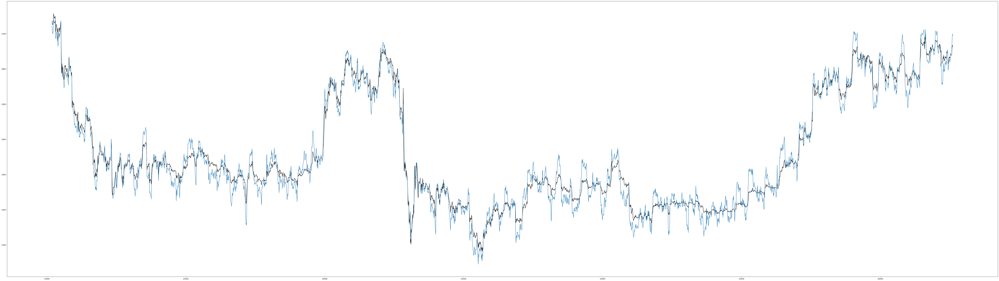

In [52]:
import matplotlib.pyplot as plt

plt.figure(figsize=(100, 28))

plt.plot(y_test4['close'], color='black')
plt.plot(y_test4['pred'])

## pred4 with backup data:

In [94]:
from talib import RSI
data_backup4['rsi_14'] = RSI(data_backup4['close'], timeperiod=14)
data_backup4['rsi_30'] = RSI(data_backup4['close'], timeperiod=30)

from talib import MA, SMA, EMA
data_backup4['ma_9'] = MA(data_backup4['close'], timeperiod=9)
data_backup4['ma_52'] = MA(data_backup4['close'], timeperiod=52)

for i in range(1,11):
    data_backup4[f'close+{i}'] = data_backup4['close'].shift(i)
data_backup4.dropna(axis=0, inplace=True)

inputs_backup4 = data_backup4.iloc[:, [6,7,8,9,10,11,12,13,14,15,16,17,18,19]]
target_backup4 = data_backup4.iloc[:, [5]]

inputs_backup4_scaled = scaler4.transform(inputs_backup4)

pred_backup4 = model4.predict(inputs_backup4_scaled)

250/250 [==============================] - 0s 2ms/step


In [95]:
raw_data4 = data_backup4.iloc[:, [0,1,2,3,4,5,6,7,8,9]]
raw_data4['pred_backup'] = pred_backup4
raw_data4['pred_backup'] = raw_data4['pred_backup'].shift(1)

/tmp/ipykernel_1196826/4216404159.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  raw_data4['pred_backup'] = pred_backup4
/tmp/ipykernel_1196826/4216404159.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  raw_data4['pred_backup'] = raw_data4['pred_backup'].shift(1)


In [96]:
raw_data4.to_excel('raw_data_4.xlsx')

## 10 previous bars for factors too

In [26]:
import pandas as pd

data5 = pd.read_csv('data_sample_three_years.csv')

data5 = data5.iloc[:, [0,1,2,3,4]]
data5.rename(columns={'date': 'open', 'low':'close', 'open':'high', 'high':'low'}, inplace=True)

data5['date'] = pd.to_datetime(data5['timestamp'], unit='s')
data5 = data5.iloc[:, [0,5,1,2,3,4]]

data_backup5 = data5.loc[ data5.timestamp >= 1675814400 ]
data5 = data5.loc[ data5.timestamp < 1675814400 ]

from talib import RSI
data5['rsi_14'] = RSI(data5['close'], timeperiod=14)
data5['rsi_30'] = RSI(data5['close'], timeperiod=30)
for i in range(1,11):
    data5[f'rsi_14+{i}'] = data5['rsi_14'].shift(i)
for i in range(1,11):
    data5[f'rsi_30+{i}'] = data5['rsi_30'].shift(i)

from talib import MA, SMA, EMA
data5['ma_9'] = MA(data5['close'], timeperiod=9)
data5['ma_52'] = MA(data5['close'], timeperiod=52)
for i in range(1,11):
    data5[f'ma_9+{i}'] = data5['ma_9'].shift(i)
for i in range(1,11):
    data5[f'ma_52+{i}'] = data5['ma_52'].shift(i)

for i in range(1,11):
    data5[f'close+{i}'] = data5['close'].shift(i)
data5.dropna(axis=0, inplace=True)

In [27]:
data5.shape

(16201, 60)

In [28]:
inputs5 = data5.iloc[:, [6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59]]
target5 = data5.iloc[:, [5]]

In [29]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, accuracy_score

X_train5, X_test5, y_train5, y_test5 = train_test_split(inputs5, target5, test_size=0.2, random_state=1, shuffle=False)

In [30]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler

scaler5 = MinMaxScaler()
scaler5.fit(X_train5)

X_train5_scaled = scaler5.transform(X_train5)
X_test5_scaled = scaler5.transform(X_test5)

In [31]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
import xgboost

# Define and train the LSTM model
model5 = Sequential([
    Dense(64, activation='relu', input_shape=(54,)),  # Input layer with 10 features
    Dense(64, activation='relu'),                     # Hidden layer with 64 units
    Dense(1)                                          # Output layer with 1 unit for regression
])

# Compile the model
model5.compile(optimizer='adam', loss='mse')  # Using Mean Squared Error loss for regression

# Train the model
model5.fit(X_train5_scaled, y_train5, epochs=100, batch_size=32)

Epoch 1/100
405/405 [==============================] - 1s 2ms/step - loss: 3283722.7500
Epoch 2/100
405/405 [==============================] - 1s 2ms/step - loss: 60826.7148
Epoch 3/100
405/405 [==============================] - 1s 2ms/step - loss: 36014.3398
Epoch 4/100
405/405 [==============================] - 1s 2ms/step - loss: 28311.1133
Epoch 5/100
405/405 [==============================] - 1s 2ms/step - loss: 24608.1055
Epoch 6/100
405/405 [==============================] - 1s 2ms/step - loss: 19742.8066
Epoch 7/100
405/405 [==============================] - 1s 2ms/step - loss: 14653.3271
Epoch 8/100
405/405 [==============================] - 1s 2ms/step - loss: 10139.3184
Epoch 9/100
405/405 [==============================] - 1s 2ms/step - loss: 6520.7808
Epoch 10/100
405/405 [==============================] - 1s 2ms/step - loss: 4066.5715
Epoch 11/100
405/405 [==============================] - 1s 2ms/step - loss: 2681.5010
Epoch 12/100
405/405 [==============================]

In [32]:
X_train5.shape

(12960, 54)

In [33]:
pred5 = model5.predict(X_test5_scaled)
y_test5['pred'] = pred5.reshape(1,-1)[0]

102/102 [==============================] - 0s 1ms/step


In [34]:
mean_squared_error(pred5, y_test5['close'])

737.9262495379959

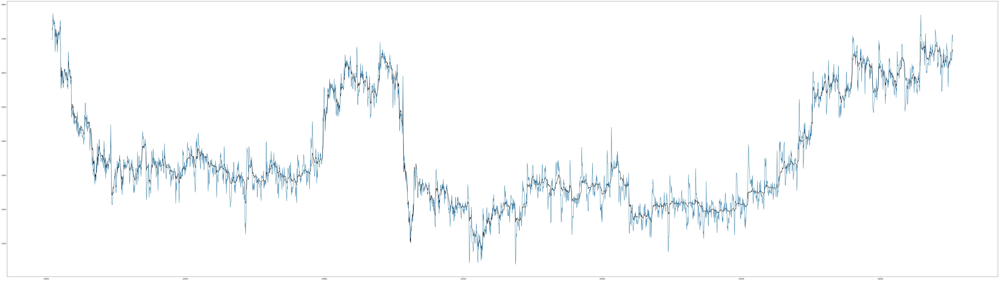

In [35]:
import matplotlib.pyplot as plt

plt.figure(figsize=(100, 28))

plt.plot(y_test5['close'], color='black')
plt.plot(y_test5['pred'])

- highs & lows sıradaki çalışma

## pred5 with backup data:

In [36]:
from talib import RSI
data_backup5['rsi_14'] = RSI(data_backup5['close'], timeperiod=14)
data_backup5['rsi_30'] = RSI(data_backup5['close'], timeperiod=30)
for i in range(1,11):
    data_backup5[f'rsi_14+{i}'] = data_backup5['rsi_14'].shift(i)
for i in range(1,11):
    data_backup5[f'rsi_30+{i}'] = data_backup5['rsi_30'].shift(i)

from talib import MA, SMA, EMA
data_backup5['ma_9'] = MA(data_backup5['close'], timeperiod=9)
data_backup5['ma_52'] = MA(data_backup5['close'], timeperiod=52)
for i in range(1,11):
    data_backup5[f'ma_9+{i}'] = data_backup5['ma_9'].shift(i)
for i in range(1,11):
    data_backup5[f'ma_52+{i}'] = data_backup5['ma_52'].shift(i)

for i in range(1,11):
    data_backup5[f'close+{i}'] = data_backup5['close'].shift(i)
data_backup5.dropna(axis=0, inplace=True)

inputs_backup5 = data_backup5.iloc[:, [6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59]]
target_backup5 = data_backup5.iloc[:, [5]]

inputs_backup5_scaled = scaler5.transform(inputs_backup5)

pred_backup5 = model5.predict(inputs_backup5_scaled)

252/252 [==============================] - 0s 2ms/step


In [37]:
raw_data5 = data_backup5.iloc[:, [0,1,2,3,4,5,6,7,28,29]]
raw_data5['pred_backup'] = pred_backup5
raw_data5['pred_backup'] = raw_data5['pred_backup'].shift(1)

/tmp/ipykernel_5869/3231437244.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  raw_data5['pred_backup'] = pred_backup5
/tmp/ipykernel_5869/3231437244.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  raw_data5['pred_backup'] = raw_data5['pred_backup'].shift(1)


In [38]:
raw_data5.to_excel('raw_data_5.xlsx')